# Credit Card Fraud Detection

In this project, I've explored the credit card fraud detection problem using the public dataset available on Kaggle and performed EDA to understand various factor given in the dataset and their effect on legitimate and fraudulent transactions.
Finally, I have used various classifiers and a neural network to predict fraudulent transactions

### General Comments about the dataset
1. Dataset consists of ~280,000 rows and 31 columns
2. The data is time series data spanning over two days
3. The dataset seems to be derived from a larger dataset upon which PCA has been used to reduce the dimensionality
4. The dataset is highly imbalaced as nearly 99.8% belongs to one class and only 0.17% belongs to other class

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

df = pd.read_csv("creditcard.csv")

df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [2]:
df.shape

(284807, 31)

In [3]:
df.isna().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

In [4]:
cols = df.columns

for col in cols:
    a = np.min(df[col])
    b = np.max(df[col])
    print(col," Min = ", a, "Max = ", b)

Time  Min =  0.0 Max =  172792.0
V1  Min =  -56.407509631329 Max =  2.45492999121121
V2  Min =  -72.7157275629303 Max =  22.0577289904909
V3  Min =  -48.3255893623954 Max =  9.38255843282114
V4  Min =  -5.68317119816995 Max =  16.8753440335975
V5  Min =  -113.743306711146 Max =  34.8016658766686
V6  Min =  -26.1605059358433 Max =  73.3016255459646
V7  Min =  -43.5572415712451 Max =  120.589493945238
V8  Min =  -73.2167184552674 Max =  20.0072083651213
V9  Min =  -13.4340663182301 Max =  15.5949946071278
V10  Min =  -24.5882624372475 Max =  23.7451361206545
V11  Min =  -4.79747346479757 Max =  12.0189131816199
V12  Min =  -18.6837146333443 Max =  7.8483920756446
V13  Min =  -5.79188120632084 Max =  7.12688295859376
V14  Min =  -19.2143254902614 Max =  10.5267660517847
V15  Min =  -4.49894467676621 Max =  8.87774159774277
V16  Min =  -14.1298545174931 Max =  17.3151115176278
V17  Min =  -25.1627993693248 Max =  9.25352625047285
V18  Min =  -9.49874592104677 Max =  5.04106918541184
V19  M

In [5]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Time,284807.0,9.481386e+04,47488.145955,0.000000,54201.500000,84692.000000,139320.500000,172792.000000
V1,284807.0,3.918649e-15,1.958696,-56.407510,-0.920373,0.018109,1.315642,2.454930
V2,284807.0,5.682686e-16,1.651309,-72.715728,-0.598550,0.065486,0.803724,22.057729
V3,284807.0,-8.761736e-15,1.516255,-48.325589,-0.890365,0.179846,1.027196,9.382558
V4,284807.0,2.811118e-15,1.415869,-5.683171,-0.848640,-0.019847,0.743341,16.875344
V5,284807.0,-1.552103e-15,1.380247,-113.743307,-0.691597,-0.054336,0.611926,34.801666
V6,284807.0,2.040130e-15,1.332271,-26.160506,-0.768296,-0.274187,0.398565,73.301626
V7,284807.0,-1.698953e-15,1.237094,-43.557242,-0.554076,0.040103,0.570436,120.589494
V8,284807.0,-1.893285e-16,1.194353,-73.216718,-0.208630,0.022358,0.327346,20.007208
V9,284807.0,-3.147640e-15,1.098632,-13.434066,-0.643098,-0.051429,0.597139,15.594995


<AxesSubplot:xlabel='Class', ylabel='count'>

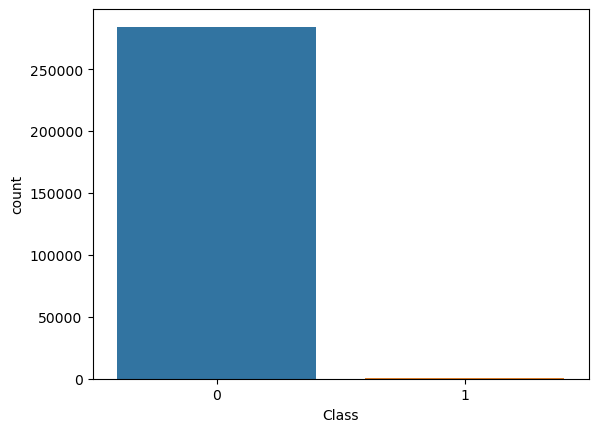

In [6]:
df["Class"].value_counts()
sns.countplot(x="Class", data=df)

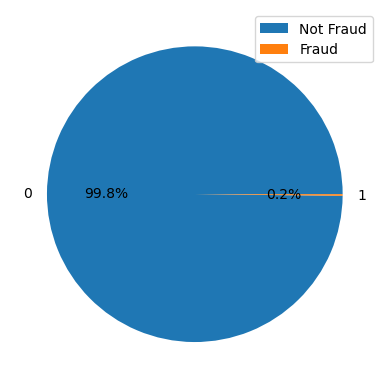

In [7]:
class_counts = df["Class"].value_counts()
fraud_labels = class_counts.index
fraud_counts = class_counts.values

plt.pie(fraud_counts, labels=fraud_labels, autopct='%1.1f%%')
plt.legend(["Not Fraud", "Fraud"])
plt.show()

C:\Users\OJAS\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\OJAS\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


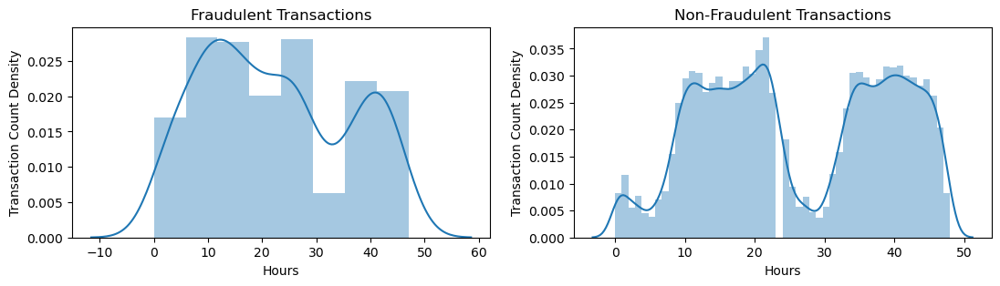

In [6]:
df2 = df.copy()
df2["Time"] = round(df["Time"]/3600)
time_span = np.arange(0, 49, 1)
df_fraud = df2[df2["Class"]==1]
df_notfraud = df2[df2["Class"]==0]

fig, axes = plt.subplots(1,2, figsize=(13, 3))

fraud = df_fraud["Time"].value_counts()
fraud = fraud.sort_index()
x1 = fraud.index
y1 = fraud.values
sns.distplot(df_fraud["Time"], ax=axes[0])
axes[0].set_xlabel("Hours")
axes[0].set_ylabel("Transaction Count Density")
axes[0].set_title("Fraudulent Transactions")

non_fraud = df_notfraud["Time"].value_counts()
non_fraud = non_fraud.sort_index()
x2 = non_fraud.index
y2 = non_fraud.values
sns.distplot(df_notfraud["Time"], ax=axes[1])
axes[1].set_xlabel("Hours")
axes[1].set_ylabel("Transaction Count Density")
axes[1].set_title("Non-Fraudulent Transactions")


plt.show()

In [40]:
df_sampled = df2.sample(frac=0.1, random_state=42)
df_sampled.shape

(28481, 31)

In [41]:
df_sampled["Class"].value_counts()

0    28435
1       46
Name: Class, dtype: int64

In [18]:
sns.set_theme(style="ticks")
sns.pairplot(df_sampled)

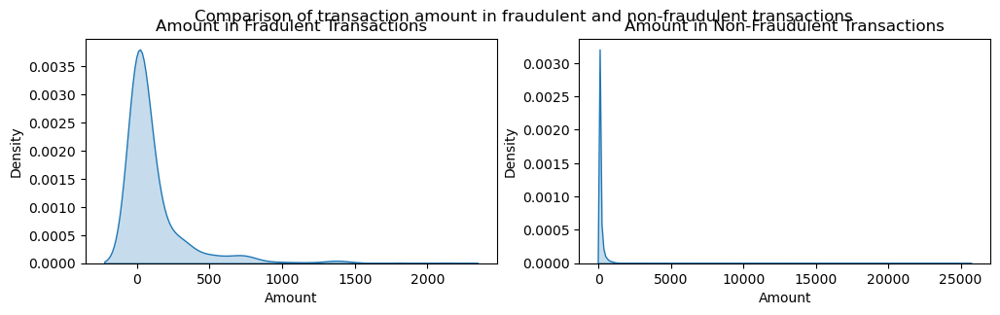

In [9]:
# # fig2, axes2 = plt.subplots(1, 2, figsize=(12,3))

# sns.kdeplot(data=df_fraud, x="Amount", color="Red", shade=True)#, ax=axes[0])
# sns.kdeplot(data=df_notfraud, x="Amount", color="Green", shade=True)
# plt.legend(["Fraud", "Not Fraud"])
# # sns.kdeplot(data=df_notfraud, x="Amount", shade=True, ax=axes[1])


# # sns.kdeplot(data=df2, x="Amount", hue="Class", multiple="stack", shade=True)

fig, axes = plt.subplots(1, 2, figsize=(12, 3))

sns.kdeplot(data=df_fraud, x="Amount", shade=True, ax=axes[0])
sns.kdeplot(data=df_notfraud, x="Amount", shade=True, ax=axes[1])
axes[0].set_title("Amount in Fradulent Transactions")
axes[1].set_title("Amount in Non-Fraudulent Transactions")
fig.suptitle("Comparison of transaction amount in fraudulent and non-fraudulent transactions")
plt.show()


As we can see from above plots that majority of the transactions, be it legitimate or fraudulent, happens over a very small range of amount. Also from the above cells, we saw that the standard deviation is very high in Amounts column. Hence, we may need to rescale Amounts to decrease the standard deviation, without affecting it's nature.

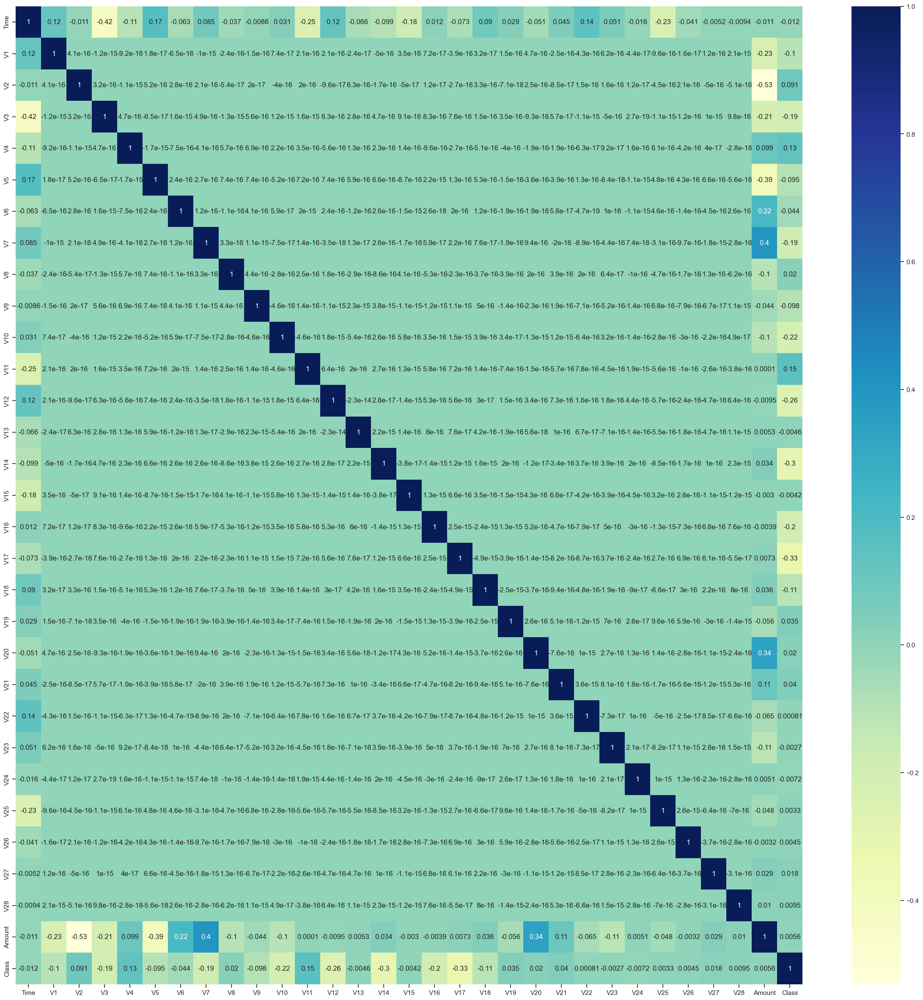

In [61]:
plt.figure(figsize=(30,30))
fraud_corr = sns.heatmap(df2.corr(), cmap="YlGnBu", annot=True)
plt.show()

### Model Building

In [2]:
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import recall_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from imblearn.combine import SMOTEENN

Here, I've used 3 models:
1. Decision Tree Classifier
2. Random Forest Classifier
3. Neural Network

In [8]:
import tensorflow
from tensorflow import keras
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.ensemble import RandomForestClassifier

def NN(x_train, y_train, x_test, y_test):
    x = x_train.shape
    x = x[1]
    model=keras.Sequential()
    model.add(keras.layers.Dense(10, input_shape=(x,), activation='relu'))
#     model.add(keras.layers.Dense(50, input_shape=(x,), activation='relu'))
#     model.add(keras.layers.Dense(20, input_shape=(50,), activation='relu'))
    model.add(keras.layers.Dense(1, input_shape=(10,), activation='sigmoid'))

    model.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy'])
    
    model.fit(x_train, y_train, epochs=10)
    
    y_pred = model.predict(x_test)
    y_pred = np.round(y_pred)
    
    print("Accuracy Score = ", accuracy_score(y_test, y_pred))
    
    print("\n Classification Report : \n", classification_report(y_test, y_pred))
    
    return y_pred

def DecisionTree(x_train, y_train, x_test, y_test):
    dt_clf = DecisionTreeClassifier()
    dt_clf.fit(x_train,y_train)
    pred = dt_clf.predict(x_test)
    print("Accuracy Score = ", accuracy_score(y_test, pred))
    print("\n Classification Report : \n", classification_report(y_test, pred))
    return pred

def RandomForest(x_train, y_train, x_test, y_test):
    rf_clf = RandomForestClassifier()
    rf_clf.fit(x_train,y_train)
    pred = rf_clf.predict(x_test)
    print("Accuracy Score = ", accuracy_score(y_test, pred))
    print("\n Classification Report : \n", classification_report(y_test, pred))
    return pred

In [7]:
x = df2.drop(columns="Class", axis=1)
y = df2["Class"]

In [9]:
(x_train, x_test, y_train, y_test) = train_test_split(x,y,test_size=0.2)

In [10]:
y_train.value_counts()

0    227461
1       384
Name: Class, dtype: int64

In [16]:
# Decision Tree Classifier

dt_pred = DecisionTree(x_train, y_train, x_test, y_test)

Accuracy Score =  0.9992392589211521

 Classification Report : 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     85316
           1       0.76      0.71      0.73       127

    accuracy                           1.00     85443
   macro avg       0.88      0.85      0.87     85443
weighted avg       1.00      1.00      1.00     85443



In [17]:
# Random Forest Classifier

rf_pred = RandomForest(x_train, y_train, x_test, y_test)

Accuracy Score =  0.9994967405170698

 Classification Report : 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     85316
           1       0.92      0.72      0.81       127

    accuracy                           1.00     85443
   macro avg       0.96      0.86      0.91     85443
weighted avg       1.00      1.00      1.00     85443



In [19]:
# Neural Network

ann_pred3 = NN(x_train, y_train, x_test, y_test)

Epoch 1/10
6231/6231 [==============================] - 18s 3ms/step - loss: 0.0162 - accuracy: 0.9978
Epoch 2/10
6231/6231 [==============================] - 16s 3ms/step - loss: 0.0051 - accuracy: 0.9992
Epoch 3/10
6231/6231 [==============================] - 15s 2ms/step - loss: 0.0047 - accuracy: 0.9993
Epoch 4/10
6231/6231 [==============================] - 15s 2ms/step - loss: 0.0057 - accuracy: 0.9993
Epoch 5/10
6231/6231 [==============================] - 15s 2ms/step - loss: 0.0049 - accuracy: 0.9993
Epoch 6/10
6231/6231 [==============================] - 16s 3ms/step - loss: 0.0042 - accuracy: 0.9993
Epoch 7/10
6231/6231 [==============================] - 16s 3ms/step - loss: 0.0053 - accuracy: 0.9993
Epoch 8/10
6231/6231 [==============================] - 17s 3ms/step - loss: 0.0040 - accuracy: 0.9994
Epoch 9/10
6231/6231 [==============================] - 15s 2ms/step - loss: 0.0040 - accuracy: 0.9994
Epoch 10/10
2671/2671 [==============================] - 6s 2ms/step
Accu

So, in the above three cells, I've used the given dataset without doing any preprocessing just to examine how the classifiers are working on the dataset.

#### Observations
1. All the 3 models gave a very high accuracy, which is understandable as majority of the data present in the dataset belong to one class and hence, gives a very accuracy score
2. Even though the accuracy score is high, precision, recall and f1-score is also fine, but I believe F1-score can be improved

So in the cells following this, I've explored various ways to handle an imbalanced dataset.
I've used the following methods:
1. Undersampling
2. Oversampling
3. Anomaly Detection Models

### Under-Sampling

In [20]:
from imblearn.under_sampling import RandomUnderSampler

class1_count = sum(y_train==1)
class0_count = class1_count

rus = RandomUnderSampler(sampling_strategy={0:class0_count, 1:class1_count}, random_state=42)

x_train_under, y_train_under = rus.fit_resample(x_train, y_train)

In [21]:
# Decision Tree Classifier

pred_dt_under = DecisionTree(x_train_under, y_train_under, x_test, y_test)

Accuracy Score =  0.931427969523542

 Classification Report : 
               precision    recall  f1-score   support

           0       1.00      0.93      0.96     85316
           1       0.02      0.85      0.04       127

    accuracy                           0.93     85443
   macro avg       0.51      0.89      0.50     85443
weighted avg       1.00      0.93      0.96     85443



In [22]:
# Random Forest Classifier

pred_rf_under = RandomForest(x_train_under, y_train_under, x_test, y_test)

Accuracy Score =  0.9824093255152558

 Classification Report : 
               precision    recall  f1-score   support

           0       1.00      0.98      0.99     85316
           1       0.07      0.85      0.13       127

    accuracy                           0.98     85443
   macro avg       0.53      0.92      0.56     85443
weighted avg       1.00      0.98      0.99     85443



In [23]:
# ANN

pred_ann_under = NN(x_train_under, y_train_under, x_test, y_test)

Epoch 1/10
23/23 [==============================] - 1s 3ms/step - loss: 2.8771 - accuracy: 0.4699
Epoch 2/10
23/23 [==============================] - 0s 3ms/step - loss: 1.2965 - accuracy: 0.5178
Epoch 3/10
23/23 [==============================] - 0s 3ms/step - loss: 0.7009 - accuracy: 0.6452
Epoch 4/10
23/23 [==============================] - 0s 3ms/step - loss: 0.5436 - accuracy: 0.7671
Epoch 5/10
23/23 [==============================] - 0s 3ms/step - loss: 0.4851 - accuracy: 0.8014
Epoch 6/10
23/23 [==============================] - 0s 3ms/step - loss: 0.4323 - accuracy: 0.8356
Epoch 7/10
23/23 [==============================] - 0s 3ms/step - loss: 0.3992 - accuracy: 0.8630
Epoch 8/10
23/23 [==============================] - 0s 4ms/step - loss: 0.3713 - accuracy: 0.8863
Epoch 9/10
23/23 [==============================] - 0s 4ms/step - loss: 0.3486 - accuracy: 0.8726
Epoch 10/10
2671/2671 [==============================] - 6s 2ms/step
Accuracy Score =  0.9060543286167386

 Classifica

### Observations:
1. Accuracy and F1-score both reduced from the previous ones
2. There is a high possibility that information loss had occurred while performing undersampling

### Over-Sampling

In [24]:
from imblearn.over_sampling import RandomOverSampler

class0_count = sum(y_train==0)
class1_count = class0_count

ros = RandomOverSampler(sampling_strategy={0:class0_count, 1:class1_count}, random_state=42)

x_train_over, y_train_over = ros.fit_resample(x_train, y_train)

y_train_over.value_counts()

0    198999
1    198999
Name: Class, dtype: int64

In [25]:
# Decision Tree Classifier

pred_dt_over = DecisionTree(x_train_over, y_train_over, x_test, y_test)

Accuracy Score =  0.9990988144142879

 Classification Report : 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     85316
           1       0.71      0.67      0.69       127

    accuracy                           1.00     85443
   macro avg       0.85      0.83      0.84     85443
weighted avg       1.00      1.00      1.00     85443



In [26]:
pred_rf_over = RandomForest(x_train_over, y_train_over, x_test, y_test)

Accuracy Score =  0.9994616293903538

 Classification Report : 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     85316
           1       0.90      0.72      0.80       127

    accuracy                           1.00     85443
   macro avg       0.95      0.86      0.90     85443
weighted avg       1.00      1.00      1.00     85443



In [27]:
pred_ann_over = NN(x_train_over, y_train_over, x_test, y_test)

Epoch 1/10
12438/12438 [==============================] - 36s 3ms/step - loss: 0.1273 - accuracy: 0.9610
Epoch 2/10
12438/12438 [==============================] - 34s 3ms/step - loss: 0.0533 - accuracy: 0.9828
Epoch 3/10
12438/12438 [==============================] - 33s 3ms/step - loss: 0.0426 - accuracy: 0.9882
Epoch 4/10
12438/12438 [==============================] - 34s 3ms/step - loss: 0.0350 - accuracy: 0.9906
Epoch 5/10
12438/12438 [==============================] - 34s 3ms/step - loss: 0.0305 - accuracy: 0.9924
Epoch 6/10
12438/12438 [==============================] - 33s 3ms/step - loss: 0.0284 - accuracy: 0.9931
Epoch 7/10
12438/12438 [==============================] - 34s 3ms/step - loss: 0.0265 - accuracy: 0.9938
Epoch 8/10
12438/12438 [==============================] - 33s 3ms/step - loss: 0.0247 - accuracy: 0.9944
Epoch 9/10
12438/12438 [==============================] - 34s 3ms/step - loss: 0.0236 - accuracy: 0.9947
Epoch 10/10
2671/2671 [==============================] 

### Observations:
1. Accuracy better than undersampling one and comparable to the first one
2. Random Forest Classifier performed best with F1-score of 80%

### Over-Sampling using SMOTE

In [28]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)

x_train_resampled, y_train_resampled = smote.fit_resample(x_train, y_train)

y_train_resampled.value_counts()

0    198999
1    198999
Name: Class, dtype: int64

In [29]:
# Decision Tree Classifier

pred_dt_smote = DecisionTree(x_train_resampled, y_train_resampled, x_test, y_test)

Accuracy Score =  0.9975305174209707

 Classification Report : 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     85316
           1       0.34      0.72      0.46       127

    accuracy                           1.00     85443
   macro avg       0.67      0.86      0.73     85443
weighted avg       1.00      1.00      1.00     85443



In [30]:
pred_rf_smote = RandomForest(x_train_resampled, y_train_resampled, x_test, y_test)

Accuracy Score =  0.9994499256814484

 Classification Report : 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     85316
           1       0.84      0.78      0.81       127

    accuracy                           1.00     85443
   macro avg       0.92      0.89      0.90     85443
weighted avg       1.00      1.00      1.00     85443



In [54]:
pred_ann_smote = NN(x_train_resampled, y_train_resampled, x_test, y_test)

Epoch 1/10
12439/12439 [==============================] - 17s 1ms/step - loss: 0.1221 - accuracy: 0.9664
Epoch 2/10
12439/12439 [==============================] - 18s 1ms/step - loss: 0.0416 - accuracy: 0.9871
Epoch 3/10
12439/12439 [==============================] - 18s 1ms/step - loss: 0.0297 - accuracy: 0.9921
Epoch 4/10
12439/12439 [==============================] - 19s 1ms/step - loss: 0.0266 - accuracy: 0.9935
Epoch 5/10
12439/12439 [==============================] - 18s 1ms/step - loss: 0.0232 - accuracy: 0.9946
Epoch 6/10
12439/12439 [==============================] - 18s 1ms/step - loss: 0.0215 - accuracy: 0.9949
Epoch 7/10
12439/12439 [==============================] - 18s 1ms/step - loss: 0.0193 - accuracy: 0.9952
Epoch 8/10
12439/12439 [==============================] - 18s 1ms/step - loss: 0.0180 - accuracy: 0.9957
Epoch 9/10
12439/12439 [==============================] - 18s 1ms/step - loss: 0.0176 - accuracy: 0.9957
Epoch 10/10
2671/2671 [==============================] 

### Observations:
1. Accuracy better than undersampling one and comparable to the first one
2. Random Forest Classifier performed best with F1-score of 81%

## Anomaly Detection Models

In [11]:
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.svm import OneClassSVM

def IsolationForestClf(x_train, y_train, x_test, y_test):
    if_clf = IsolationForest(n_estimators=100, contamination=0.01, random_state=42)
    if_clf.fit(x_train,y_train)
    pred = if_clf.predict(x_test)
    pred[pred == 1] = 0
    pred[pred == -1] = 1
    print("Accuracy Score = ", accuracy_score(y_test, pred))
    print("\n Classification Report : \n", classification_report(y_test, pred))
    return pred

def LocalOutlier(x_train, y_train, x_test, y_test):
    lof_clf = LocalOutlierFactor(n_neighbors=20, contamination=0.01, novelty=True)
    lof_clf.fit(x_train,y_train)
    pred = lof_clf.predict(x_test)
    pred[pred == 1] = 0
    pred[pred == -1] = 1
    print("Accuracy Score = ", accuracy_score(y_test, pred))
    print("\n Classification Report : \n", classification_report(y_test, pred))
    return pred 

def OneClassSVMClf(x_train, y_train, x_test, y_test):
    osvm_clf = OneClassSVM(kernel='rbf', gamma='auto')
    osvm_clf.fit(x_train,y_train)
    pred = osvm_clf.predict(x_test)
    pred[pred == 1] = 0
    pred[pred == -1] = 1
    print("Accuracy Score = ", accuracy_score(y_test, pred))
    print("\n Classification Report : \n", classification_report(y_test, pred))
    return pred 

In [13]:
# Local Outlier Factor

lof_pred = LocalOutlier(x_train, y_train, x_test, y_test)

C:\Users\OJAS\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LocalOutlierFactor was fitted with feature names
  warnings.warn(


Accuracy Score =  0.9892033285348126

 Classification Report : 
               precision    recall  f1-score   support

           0       1.00      0.99      0.99     56854
           1       0.06      0.30      0.09       108

    accuracy                           0.99     56962
   macro avg       0.53      0.64      0.54     56962
weighted avg       1.00      0.99      0.99     56962



In [12]:
# Isolation Forest

if_pred = IsolationForestClf(x_train, y_train, x_test, y_test)

C:\Users\OJAS\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Accuracy Score =  0.9898353288157017

 Classification Report : 
               precision    recall  f1-score   support

           0       1.00      0.99      0.99     56854
           1       0.11      0.60      0.18       108

    accuracy                           0.99     56962
   macro avg       0.55      0.80      0.59     56962
weighted avg       1.00      0.99      0.99     56962



### Observations:
1. Accuracy is good but poor F1-score

So far, Random Forest Classifier has performed best with F1-score 81%, when we perform SMOTE oversampling on the dataset.

Now, let's try to make some changes in the dataset and predict once again

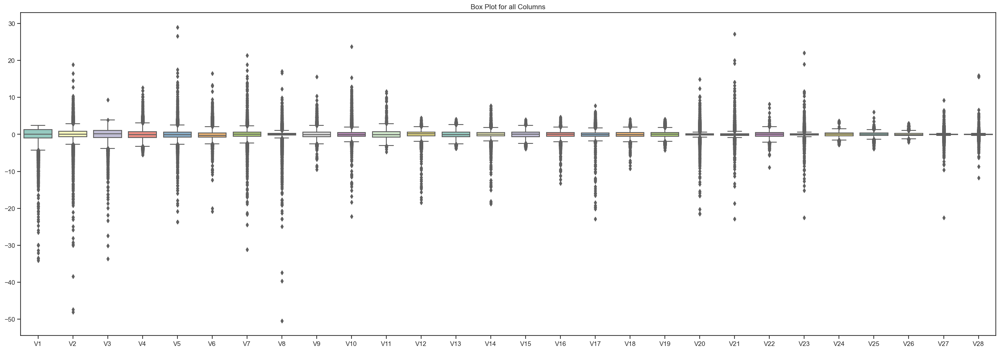

In [29]:
df_sampled2 = df_sampled.drop(columns=['Time', 'Amount', 'Class'])

plt.figure(figsize=(30,10))
sns.boxplot(data=df_sampled2, palette='Set3')
plt.title("Box Plot for all Columns")
plt.show()

In [42]:
from sklearn.preprocessing import RobustScaler

scaler = RobustScaler()

df_sampled['Amount'] = scaler.fit_transform(df_sampled['Amount'].to_numpy().reshape(-1,1))

df_sampled['Amount'].describe()

count    28481.000000
mean         0.921921
std          3.192242
min         -0.307854
25%         -0.225955
50%          0.000000
75%          0.774045
max         73.043679
Name: Amount, dtype: float64

In [45]:
x2 = df_sampled.drop(columns='Class')
y2 = df_sampled['Class']
x2.shape, y2.shape

((28481, 30), (28481,))

In [46]:
(x_train2, x_test2, y_train2, y_test2) = train_test_split(x2,y2,test_size=0.2)

In [48]:
iof_pred2 = IsolationForestClf(x_train2, y_train2, x_test2, y_test2)

C:\Users\OJAS\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Accuracy Score =  0.9922766368263999

 Classification Report : 
               precision    recall  f1-score   support

           0       1.00      0.99      1.00      5688
           1       0.14      0.78      0.24         9

    accuracy                           0.99      5697
   macro avg       0.57      0.89      0.62      5697
weighted avg       1.00      0.99      0.99      5697



In [49]:
lof_pred2 = LocalOutlier(x_train2, y_train2, x_test2, y_test2)

C:\Users\OJAS\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LocalOutlierFactor was fitted with feature names
  warnings.warn(


Accuracy Score =  0.992452167807618

 Classification Report : 
               precision    recall  f1-score   support

           0       1.00      0.99      1.00      5688
           1       0.13      0.67      0.22         9

    accuracy                           0.99      5697
   macro avg       0.56      0.83      0.61      5697
weighted avg       1.00      0.99      0.99      5697



In [50]:
osvm_pred2 = OneClassSVMClf(x_train2, y_train2, x_test2, y_test2)

Accuracy Score =  0.494295243110409

 Classification Report : 
               precision    recall  f1-score   support

           0       1.00      0.49      0.66      5688
           1       0.00      1.00      0.01         9

    accuracy                           0.49      5697
   macro avg       0.50      0.75      0.33      5697
weighted avg       1.00      0.49      0.66      5697



In [52]:
df_pred2 = DecisionTree(x_train2, y_train2, x_test2, y_test2)

Accuracy Score =  0.9994734070563455

 Classification Report : 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      5688
           1       1.00      0.67      0.80         9

    accuracy                           1.00      5697
   macro avg       1.00      0.83      0.90      5697
weighted avg       1.00      1.00      1.00      5697



In [53]:
rf_pred2 = RandomForest(x_train2, y_train2, x_test2, y_test2)

Accuracy Score =  0.9996489380375636

 Classification Report : 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      5688
           1       1.00      0.78      0.88         9

    accuracy                           1.00      5697
   macro avg       1.00      0.89      0.94      5697
weighted avg       1.00      1.00      1.00      5697



In [54]:
ann_pred2 = NN(x_train2, y_train2, x_test2, y_test2)

Epoch 1/10
712/712 [==============================] - 3s 2ms/step - loss: 0.0266 - accuracy: 0.9981
Epoch 2/10
712/712 [==============================] - 1s 2ms/step - loss: 0.0097 - accuracy: 0.9989
Epoch 3/10
712/712 [==============================] - 1s 2ms/step - loss: 0.0056 - accuracy: 0.9993
Epoch 4/10
712/712 [==============================] - 1s 2ms/step - loss: 0.0045 - accuracy: 0.9992
Epoch 5/10
712/712 [==============================] - 1s 2ms/step - loss: 0.0035 - accuracy: 0.9994
Epoch 6/10
712/712 [==============================] - 1s 2ms/step - loss: 0.0030 - accuracy: 0.9994
Epoch 7/10
712/712 [==============================] - 1s 2ms/step - loss: 0.0027 - accuracy: 0.9996
Epoch 8/10
712/712 [==============================] - 1s 2ms/step - loss: 0.0026 - accuracy: 0.9994
Epoch 9/10
712/712 [==============================] - 1s 2ms/step - loss: 0.0023 - accuracy: 0.9995
Epoch 10/10
179/179 [==============================] - 0s 2ms/step
Accuracy Score =  0.9994734070563

I have modified the Amount column in the dataset as it had a lot of outliers and a high standard deviation. I've used RobustScaler to transform the dataset.

Random Forest Classifier performed best with an accuracy of 99.96% and F1-score of 88%